In [ ]:
!pip install diffusers==0.11.1
!pip install transformers scipy ftfy accelerate

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)

In [3]:
pipe = pipe.to("cuda")

  0%|          | 0/50 [00:00<?, ?it/s]

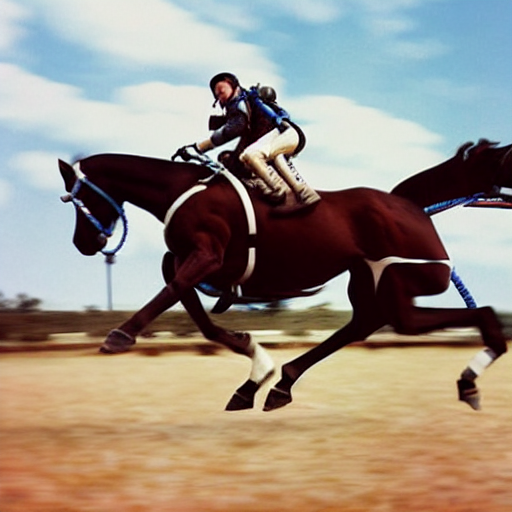

In [4]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt).images[0]

image

  0%|          | 0/50 [00:00<?, ?it/s]

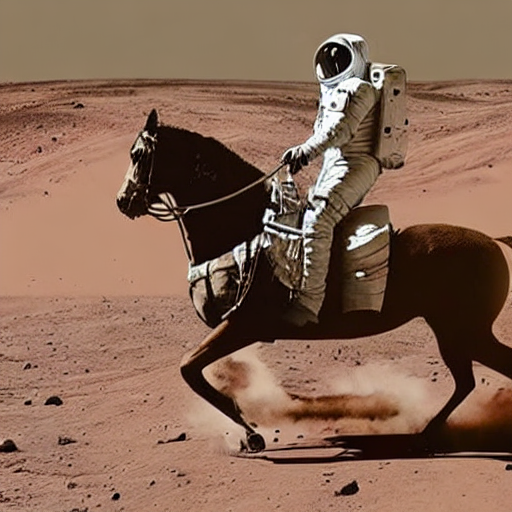

In [5]:
prompt = "a photo of an astronaut riding a horse on mars"
image1 = pipe(prompt).images[0]

image1

num_inference_steps는 이미지 생성시 denoising 단계를 의미하며 숫자를 높이면 더
높은 품질의 이미지를 얻을 수 있음

guidance_scale은 prompt에 가까운 정도를 표현 (Classifier free guidance)

  0%|          | 0/15 [00:00<?, ?it/s]

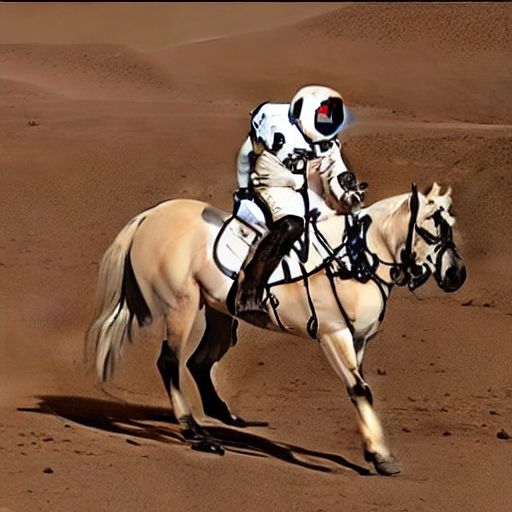

In [7]:
import torch

generator = torch.Generator("cuda").manual_seed(42)
image = pipe(prompt, num_inference_steps=15, generator=generator).images[0]

image

In [8]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

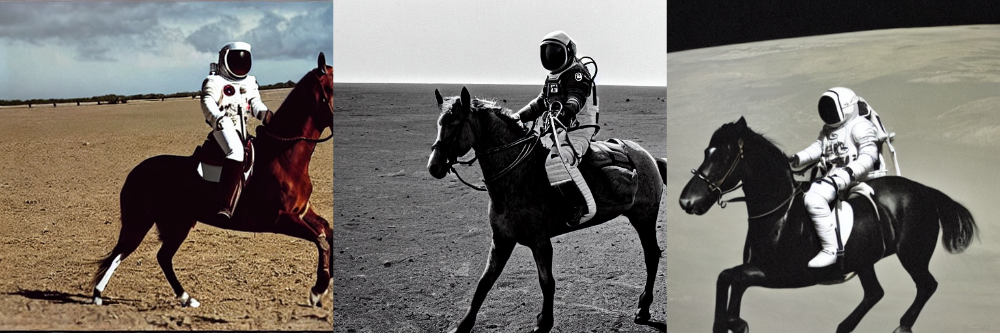

In [9]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt).images

grid = image_grid(images, rows=1, cols=3)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

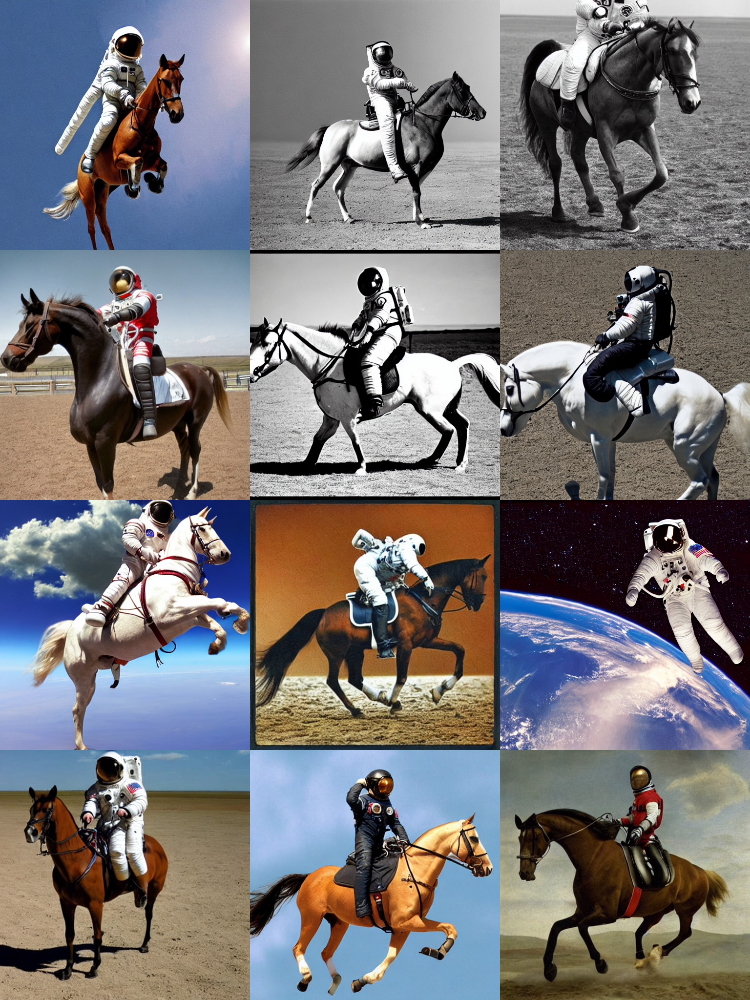

In [10]:
num_cols = 3
num_rows = 4

prompt = ["a photograph of an astronaut riding a horse"] * num_cols

all_images = []
for i in range(num_rows):
  images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

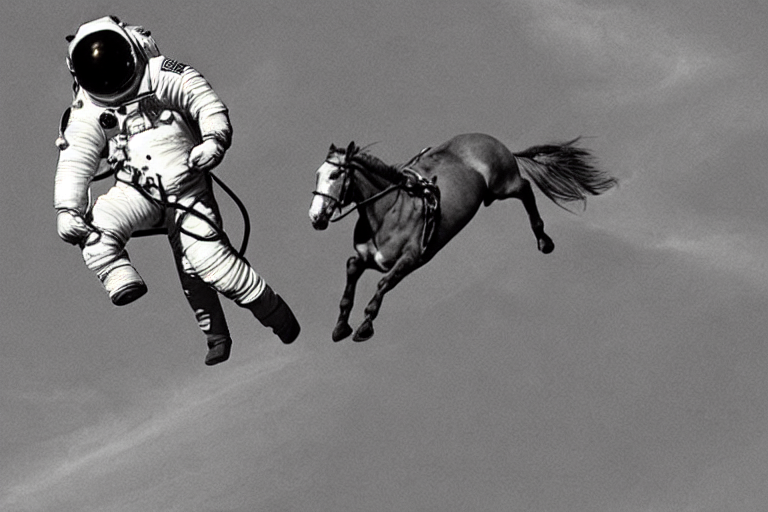

In [11]:
prompt = "a photograph of an astronaut riding a horse"

# 이미지 크기 조절
image = pipe(prompt, height=512, width=768).images[0]
image

# Latent diffusion model (LDM)

1. An autoencoder (VAE).
2. U-Net
3. text-encoder

In [16]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# Autoencoder model -VAE
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# U-net model
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

In [14]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")
# scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule='scaled_linear', num_train_timesteps=1000)

In [17]:
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device)

In [18]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512
width = 512
num_inference_steps = 100
guidance_scale = 7.5
generator = torch.manual_seed(32)

batch_size = 1

Tokenize text and text Embedding

In [20]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

with torch.no_grad():
  text_embeddings = text_encoder(text_input.input_ids.to(device))[0]

In [21]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
  uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]

conditioned input (`text_embeddings`), unconditional embeddings (`uncond_embeddings`) -condition을 점차 안 주는 방향으로 학습시켜 contional model의 성능 구현에 도움

In [22]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

In [23]:
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(device)

In [24]:
latents.shape

torch.Size([1, 4, 64, 64])

In [25]:
scheduler.set_timesteps(num_inference_steps)

Latent에 noise 추가

In [26]:
latents = latents * scheduler.init_noise_sigma

In [27]:
from tqdm.auto import tqdm
from torch import autocast

for t in tqdm(scheduler.timesteps):
  latent_model_input = torch.cat([latents] * 2)

  latent_model_input = scheduler.scale_model_input(latent_model_input, t)

  with torch.no_grad():
    noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample
  #  perform guidance
  noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
  noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

  latents = scheduler.step(noise_pred, t, latents).prev_sample

  0%|          | 0/100 [00:00<?, ?it/s]

VAE decoder를 사용하여 이미지 생성

In [28]:
latents = 1 / 0.18215 * latents

with torch.no_grad():
  image = vae.decode(latents).sample

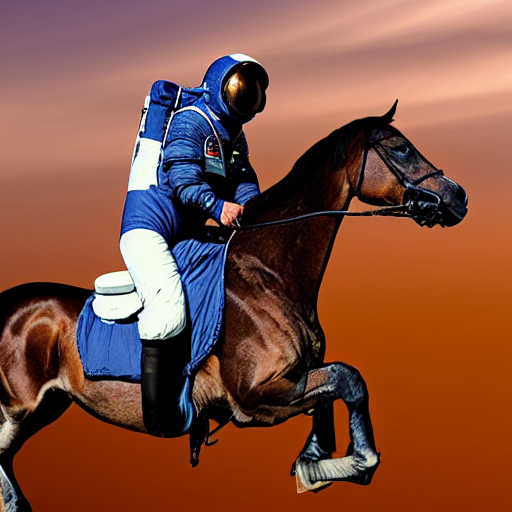

In [29]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]